### 💻 Verify GPU Configuration (Activate GPU for faster execution)


In [ ]:
# uncomment to verify
# from google.colab import output
# import torch

# if not torch.cuda.is_available():
#     from IPython.display import display, Markdown
#     display(Markdown("## ❌ **ERROR : GPU is not detected**"))
#     display(Markdown("Go to **Runtime > Change runtime type** and selection **T4 GPU**."))

#     output.eval_js('alert("Missing GPU !")')
#     raise SystemError("The GPU must be activated to continue.")
# else:
#     print("✅ GPU détecté :", torch.cuda.get_device_name(0))

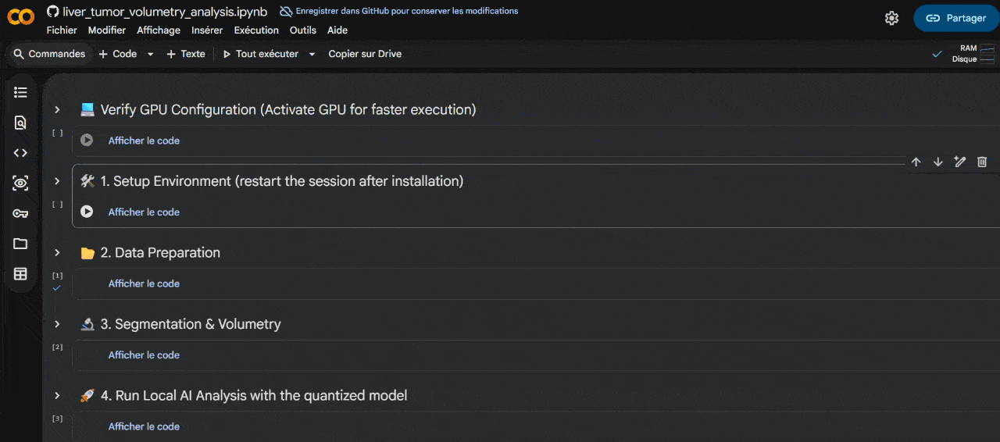

### 🛠️ 1. Setup Environment (restart the session after installation)

In [ ]:
!git clone https://github.com/Oumar199/LiverFibrosisDetection.git
!pip install -e LiverFibrosisDetection/liver-fibrosis-detection -qqq


print("\n✅ Environment ready.")

print("Runtime will restart !")

import os
os.kill(os.getpid(), 9)




Cloning into 'LiverVolumetry'...
remote: Enumerating objects: 490, done.
remote: Counting objects: 100% (490/490), done.
remote: Compressing objects: 100% (184/184), done.
remote: Total 490 (delta 324), reused 447 (delta 293), pack-reused 0 (from 0)
Receiving objects: 100% (490/490), 10.94 MiB | 1.48 MiB/s, done.
Resolving deltas: 100% (324/324), done.
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 62.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


### 📂 2. Data Preparation

#### Load an image

Choose an option:
1. Use default sample image
2. Upload your own image
Enter 1 or 2: 2


Saving output_liver_segmentation.jpg to output_liver_segmentation.jpg
✅ Uploaded: output_liver_segmentation.jpg


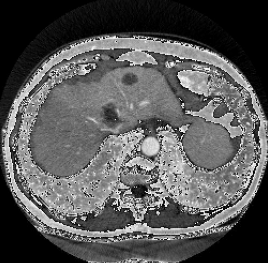

In [ ]:
from google.colab import files
from IPython.display import Image, display
import os

print("Choose an option:")
print("1. Use default sample image")
print("2. Upload your own image")

choice = input("Enter 1 or 2: ")

IMAGE_PATH = "images/sample_ultrasound.jpg"

if choice == "2":
    uploaded = files.upload()
    if uploaded:
        filename = list(uploaded.keys())[0]
        IMAGE_PATH = os.path.join("images", filename)
        print(f"✅ Uploaded: {filename}")
else:
    if not os.path.exists(IMAGE_PATH):
        !mkdir -p images
        !wget -O {IMAGE_PATH} https://github.com/Oumar199/LiverVolumetry/blob/main/images/output_liver_segmentation.jpg?raw=true
    print("✅ Using default sample.")

display(Image(IMAGE_PATH, width=400))

#### Patient data

Below an example of necessary values to provide:
- Age (years): `55`
- Sex (M/F): `F`
- BMI (kg/m²): `28`

--- Vital Signs (Enter = normal value) ---
- Heart rate (bpm): `83`
- Temperature (°C): `37`
- Blood pressure (ex: 120/80): `12`

Write
```python 
collect_patient_data(necessary_only=False)
```
if you want to provide more clinical values.

In [ ]:
from liver_fibrosis_detection.utils.data_preparation import collect_patient_data

# seize patient data
patient_data = collect_patient_data(necessary_ony=True)

### 🔐 3.1 Ensure you are authorized to use the Medgemma-1.1-2b-it model (see below)

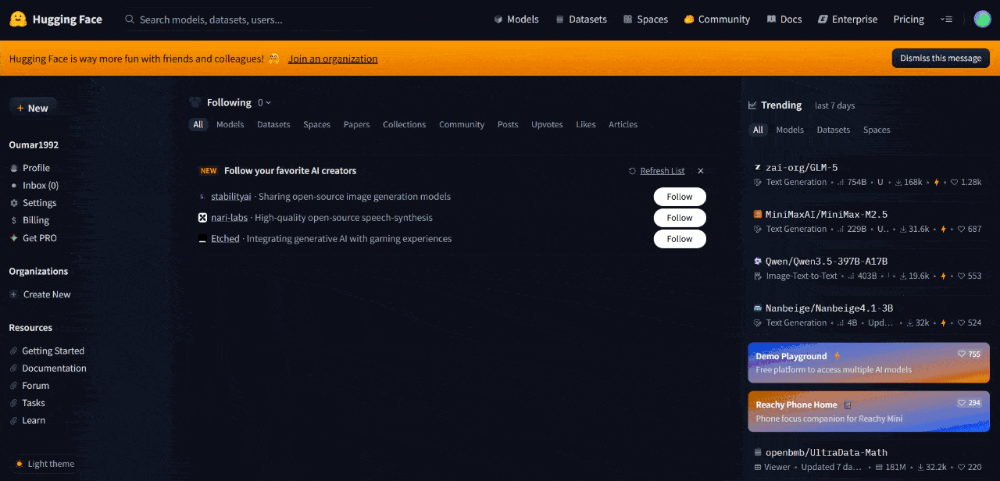

Find the model in [huggingface](https://huggingface.co/google/gemma-1.1-2b-it). 

### 🔐 5.2 Log into you huggingface account

In [ ]:
from huggingface_hub import login

login()

### 🚀 4. Run Local AI Analysis with Medgemma

In [ ]:
from liver_fibrosis_detection.inference.fibrosis_analysis import run_full_analysis
from google.colab import userdata, files
from transformers import pipeline
import torch

# Configure model and scaler paths
MODEL_PATH = '/content/LiverFibrosisDetection/models/fibro_model_v4_1_balanced.pth'
SCALER_PATH = '/content/LiverFibrosisDetection/models/scaler_params_final.json'

# ───────────────────────────────────────────────────────────────────
# Load analysis model
# ───────────────────────────────────────────────────────────────────
print("🔧 Loading MedGemma 1.1-2B-it...")

try:
    llm = pipeline(
        "text-generation",
        model="google/gemma-1.1-2b-it",
        token=userdata.get('medgemma'),
        device_map="auto",
        torch_dtype=torch.float16,  
        max_new_tokens=500
    )
    clear_output()
    print("✅ FibroDetect V4.1 + MedGemma prêt\n")
except Exception as e:
    llm = None
    print(f"⚠️ MedGemma non disponible: {e}")
    print("   Mode sans LLM activé\n")

# ───────────────────────────────────────────────────────────────────
# Analysis
# ───────────────────────────────────────────────────────────────────
run_full_analysis(
    model_path=MODEL_PATH,
    scaler_path=SCALER_PATH,
    img_path=IMAGE_PATH,
    patient_data=patient_data,
    llm=llm
)

print("\n" + "="*70)
print("✅ ANALYSIS IS SUCCESSFUL")
print("="*70)


⏳ Loading Medgemma model...


Fetching 7 files:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Loading weights:   0%|          | 0/883 [00:00<?, ?it/s]

Setting `pad_token_id` to `eos_token_id`:1 for open-end generation.



📋 CLINICAL INSIGHT


This is a CT scan of the abdomen showing a small liver lesion. The liver volume is 9.18 cm3, and the tumor volume is 0.56 cm3. The tumor-to-liver ratio is 6.10%. This suggests a small liver lesion, which may be a benign or malignant tumor. Further evaluation is needed to determine the nature of the lesion.

**Disclaimer:** This is an AI-generated interpretation and should not be used for medical diagnosis. A qualified healthcare professional should be consulted for any medical concerns.